# Employee Staffing Optimization

## Context

To ensure long-term financial sustainability, Canada Post has to optimize its staffing to meet the demand. Canada Post relies on workforce to carry out its operations. To achieve the goal of delivering on-time, Canada Post wants to plan its workforce and attendence effectively

## Objective

we will conduct data preparation and exploratory data analysis (EDA) to uncover key patterns, relationships, and insights within the dataset. Through this EDA results, we aim to develop few Machine Learning models and select an optimized model for staffing optimization. 

**Data Dictionary**

* **CALENDAR_DATE**: Date of the recorded data
* **NATIONAL_HOLIDAY_IND**: Indicator for whether it's a national holiday (Yes/No)
* **PROVINCIAL_HOLIDAY_IND**: Indicator for whether it's a provincial holiday (Yes/No)
* **IMPACT_DAY_FLG**: Flag indicating if it's an impact day
* **DAY_OF_WEEK**: Day of the week (e.g., Monday, Tuesday, etc.)
* **WEEK_OF_YEAR**: Week number within the year
* **DAY_OF_MONTH**: Day of the month
* **MONTH_NO**: Numeric representation of the month
* **YEAR_NO**: Numeric representation of the year
* **Workload sum**: Recorded volume of data
* **Scheduled Hours**: Hours scheduled for the day
* **Planned Absences**: Planned absentees for the day
* **Unplanned Absences**: Unplanned absentees for the day
* **Unpaid Absences**: Unpaid absentees (Loss of pay) for the day
* **Weather Flag**: Good weather or bad weather depending upon the below factors
    * Minimum temperature: Below freezing (0°C or 32°F).
    * Maximum temperature: Above 35°C (95°F).
    * Heavy rainfall: More than 50mm in a day.
    * Heavy snowfall: More than 15cm (6 inches) in a day.
    * Strong winds: Gusts exceeding 70 km/h (43 mph).

In [13]:
!pip install ydata_profiling

In [1]:
# import necessary libraries
import pandas as pd
import numpy as np
import seaborn as sns
from ydata_profiling import ProfileReport
import warnings
warnings.filterwarnings('ignore')

In [3]:
#!pip install --upgrade bottleneck

  Obtaining dependency information for bottleneck from https://files.pythonhosted.org/packages/a7/ef/f5ee62f290f61842b34413ae82042825556ee1078e195d0e34c674fdc72e/Bottleneck-1.3.8-cp311-cp311-win_amd64.whl.metadata
   ---------------------------------------- 0.0/110.1 kB ? eta -:--:--
   --------------------------------- ------ 92.2/110.1 kB 1.7 MB/s eta 0:00:01
   ---------------------------------------- 110.1/110.1 kB 2.1 MB/s eta 0:00:00
  Attempting uninstall: bottleneck
    Found existing installation: Bottleneck 1.3.5
    Uninstalling Bottleneck-1.3.5:
      Successfully uninstalled Bottleneck-1.3.5


In [1]:
#import bottleneck
#print(bottleneck.__version__)


1.3.8


In [3]:
#!pip install --upgrade openpyxl


  Obtaining dependency information for openpyxl from https://files.pythonhosted.org/packages/6a/94/a59521de836ef0da54aaf50da6c4da8fb4072fb3053fa71f052fd9399e7a/openpyxl-3.1.2-py2.py3-none-any.whl.metadata
   ---------------------------------------- 0.0/250.0 kB ? eta -:--:--
   ------------- -------------------------- 81.9/250.0 kB 1.6 MB/s eta 0:00:01
   ---------------------------------------- 250.0/250.0 kB 2.6 MB/s eta 0:00:00
  Attempting uninstall: openpyxl
    Found existing installation: openpyxl 3.0.10
    Uninstalling openpyxl-3.0.10:
      Successfully uninstalled openpyxl-3.0.10


In [1]:
#import openpyxl
#print(openpyxl.__version__)


3.1.2


In [2]:
import pandas as pd
# Loading the Excel file into a DataFrame
df = pd.read_excel(r'C:\Users\mahes\Downloads\Capstone_Data.xlsx', sheet_name='2022-2023')

In [3]:
df.head()

,Date,Workload sum,Scheduled Hours,Planned Absences,Unplanned Absences,Unpaid Absences,Actual Work Hours,National_Holiday_IND,Provincial_Holiday_IND,Impact_Day_FLG,Day_of_Week,Week_of_Year,Day_of_Month,Month_no,Year_NO,Weather Flag,Weekend_Flag,Holiday_Flag,Weekend_Holiday_Flag
0,1/1/2022,0,0.00,0.00,0.00,0.00,0.00,0,0,0,7,0,1,1,2022,0,1,0,1
1,1/2/2022,736,0.00,0.00,0.00,0.00,0.00,0,0,0,1,1,2,1,2022,0,1,0,1
2,1/3/2022,7340,4227.05,501.00,522.55,217.37,3203.50,1,0,0,2,1,3,1,2022,0,0,1,1
3,1/4/2022,59670,9474.97,1250.35,1227.70,449.35,6996.92,0,0,0,3,1,4,1,2022,0,0,0,0
4,1/5/2022,54192,9162.78,1276.22,1437.66,422.35,6448.90,0,0,0,4,1,5,1,2022,0,0,0,0


In [4]:
df.columns

Index(['Date', 'Workload sum', 'Scheduled Hours', 'Planned Absences',
       'Unplanned Absences', 'Unpaid Absences', 'Actual Work Hours',
       'National_Holiday_IND', 'Provincial_Holiday_IND', 'Impact_Day_FLG',
       'Day_of_Week', 'Week_of_Year', 'Day_of_Month', 'Month_no', 'Year_NO',
       'Weather Flag', 'Weekend_Flag', 'Holiday_Flag', 'Weekend_Holiday_Flag'],
      dtype='object')

In [5]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 730 entries, 0 to 729
Data columns (total 19 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Date                    730 non-null    object 
 1   Workload sum            730 non-null    int64  
 2   Scheduled Hours         730 non-null    float64
 3   Planned Absences        730 non-null    float64
 4   Unplanned Absences      730 non-null    float64
 5   Unpaid Absences         730 non-null    float64
 6   Actual Work Hours       730 non-null    float64
 7   National_Holiday_IND    730 non-null    int64  
 8   Provincial_Holiday_IND  730 non-null    int64  
 9   Impact_Day_FLG          730 non-null    int64  
 10  Day_of_Week             730 non-null    int64  
 11  Week_of_Year            730 non-null    int64  
 12  Day_of_Month            730 non-null    int64  
 13  Month_no                730 non-null    int64  
 14  Year_NO                 730 non-null    in

In [6]:
# Summary statistics for numerical columns
df.describe()

,Workload sum,Scheduled Hours,Planned Absences,Unplanned Absences,Unpaid Absences,Actual Work Hours,National_Holiday_IND,Provincial_Holiday_IND,Impact_Day_FLG,Day_of_Week,Week_of_Year,Day_of_Month,Month_no,Year_NO,Weather Flag,Weekend_Flag,Holiday_Flag,Weekend_Holiday_Flag
count,730.000000,730.000000,730.000000,730.000000,730.000000,730.000000,730.000000,730.000000,730.000000,730.000000,730.000000,730.000000,730.000000,730.000000,730.000000,730.000000,730.000000,730.000000
mean,30117.024658,6770.770452,944.994973,580.259137,219.254712,5245.516342,0.031507,0.002740,0.032877,4.000000,26.500000,15.720548,6.526027,2022.500000,0.013699,0.287671,0.065753,0.345205
std,22763.432435,2760.377769,491.602035,318.497372,145.510402,2261.458573,0.174803,0.052306,0.178436,2.004795,15.062126,8.802278,3.450215,0.500343,0.116316,0.452987,0.248021,0.475761
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,2022.000000,0.000000,0.000000,0.000000,0.000000
25%,62.000000,4804.187500,582.955000,399.610000,111.865000,3541.132500,0.000000,0.000000,0.000000,2.000000,13.250000,8.000000,4.000000,2022.000000,0.000000,0.000000,0.000000,0.000000
50%,34462.500000,7865.640000,939.800000,558.350000,201.335000,6088.010000,0.000000,0.000000,0.000000,4.000000,26.500000,16.000000,7.000000,2022.500000,0.000000,0.000000,0.000000,0.000000
75%,44001.000000,8892.277500,1288.422500,730.290000,306.585000,6936.247500,0.000000,0.000000,0.000000,6.000000,39.750000,23.000000,10.000000,2023.000000,0.000000,1.000000,0.000000,1.000000
max,85176.000000,17128.440000,2321.750000,3697.800000,1544.600000,14440.740000,1.000000,1.000000,1.000000,7.000000,53.000000,31.000000,12.000000,2023.000000,1.000000,1.000000,1.000000,1.000000


In [7]:
profile = ProfileReport(df, title = "Report Profiling")

In [8]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [10]:
# Calculate Q1 (25th percentile) and Q3 (75th percentile) of the 'Workload_Sum' column
Q1 = df['Workload sum'].quantile(0.25)
Q3 = df['Workload sum'].quantile(0.75)
print(Q1,Q3)

62.0 44001.0


In [16]:

# Calculate the Interquartile Range (IQR)
IQR = Q3 - Q1

# Define outliers as those values that fall outside of Q1 - 1.5 * IQR and Q3 + 1.5 * IQR
outlier_condition = ((df['Workload sum'] < (Q1 - 1.5 * IQR)) | (df['Workload sum'] > (Q3 + 1.5 * IQR)))

# Add a new column to flag outliers
df['Outlier_Flag'] = 0  # Initialize the column with 0s
df.loc[outlier_condition, 'Outlier_Flag'] = 1  # Flag outliers with 1

# Check the first few rows to verify the new column
print(df.head())

       Date  Workload sum  Scheduled Hours  Planned Absences  \
0  1/1/2022             0             0.00              0.00   
1  1/2/2022           736             0.00              0.00   
2  1/3/2022          7340          4227.05            501.00   
3  1/4/2022         59670          9474.97           1250.35   
4  1/5/2022         54192          9162.78           1276.22   

   Unplanned Absences  Unpaid Absences  Actual Work Hours  \
0                0.00             0.00               0.00   
1                0.00             0.00               0.00   
2              522.55           217.37            3203.50   
3             1227.70           449.35            6996.92   
4             1437.66           422.35            6448.90   

   National_Holiday_IND  Provincial_Holiday_IND  Impact_Day_FLG  Day_of_Week  \
0                     0                       0               0            7   
1                     0                       0               0            1   
2       

In [19]:
check = df[df['Outlier_Flag'] == 0]
print(check)

           Date  Workload sum  Scheduled Hours  Planned Absences  \
0      1/1/2022             0             0.00              0.00   
1      1/2/2022           736             0.00              0.00   
2      1/3/2022          7340          4227.05            501.00   
3      1/4/2022         59670          9474.97           1250.35   
4      1/5/2022         54192          9162.78           1276.22   
..          ...           ...              ...               ...   
725  12/27/2023         68316         13748.90           1219.72   
726  12/28/2023         46299         17128.44           1389.00   
727  12/29/2023         35137          7804.39            876.35   
728  12/30/2023             5          2558.00            410.42   
729  12/31/2023           144          2242.75            486.52   

     Unplanned Absences  Unpaid Absences  Actual Work Hours  \
0                  0.00             0.00               0.00   
1                  0.00             0.00               0.

In [8]:
# Convert 'Date' to datetime
df['Date'] = pd.to_datetime(df['Date'])

# Set 'Date' as the index of the DataFrame
df.set_index('Date', inplace=True)

# Ensure the DataFrame is sorted by the index
df.sort_index(inplace=True)

In [9]:
print(df.index.freq)

None


In [10]:
# Set the frequency of the DataFrame index
df = df.asfreq('D')  # 'D' for daily. Use 'M' for monthly, 'W' for weekly, etc.

In [11]:
df.head()

,Workload sum,Scheduled Hours,Planned Absences,Unplanned Absences,Unpaid Absences,Actual Work Hours,National_Holiday_IND,Provincial_Holiday_IND,Impact_Day_FLG,Day_of_Week,Week_of_Year,Day_of_Month,Month_no,Year_NO,Weather Flag,Holiday_impact,Holiday_flag,no_of_prev_holidays,max_holiday,absences
Date,,,,,,,,,,,,,,,,,,,,
2022-01-01,0,0.00,0.00,0.00,0.00,0.00,0,0,0,7,0,1,1,2022,0,0,0,0,0,0.00
2022-01-02,736,0.00,0.00,0.00,0.00,0.00,0,0,0,1,1,2,1,2022,0,0,1,1,0,0.00
2022-01-03,7340,4227.05,501.00,522.55,217.37,3203.50,1,0,0,2,1,3,1,2022,0,0,1,2,0,1023.55
2022-01-04,59670,9474.97,1250.35,1227.70,449.35,6996.92,0,0,0,3,1,4,1,2022,0,1,1,3,3,2478.05
2022-01-05,54192,9162.78,1276.22,1437.66,422.35,6448.90,0,0,0,4,1,5,1,2022,0,0,0,0,0,2713.88


In [12]:
from statsmodels.tsa.stattools import adfuller

def adf_test(series, title=''):
    """
    Pass in a time series and an optional title, returns an ADF report
    """
    print(f'Augmented Dickey-Fuller Test: {title}')
    result = adfuller(series.dropna(), autolag='AIC')  # dropna() handles differenced data
    labels = ['ADF test statistic', 'p-value', '# lags used', '# observations']
    out = pd.Series(result[0:4], index=labels)

    for key, val in result[4].items():
        out[f'critical value ({key})'] = val
    print(out.to_string())  # .to_string() makes it print prettier

    if result[1] <= 0.05:
        print("Strong evidence against the null hypothesis")
        print("Reject the null hypothesis")
        print("Data has no unit root and is stationary")
    else:
        print("Weak evidence against the null hypothesis")
        print("Fail to reject the null hypothesis")
        print("Data has a unit root and is non-stationary")

# Example using 'Planned Absences'
adf_test(df['absences'], 'absences')


Augmented Dickey-Fuller Test: absences
ADF test statistic       -2.227289
p-value                   0.196491
# lags used              20.000000
# observations          709.000000
critical value (1%)      -3.439607
critical value (5%)      -2.865625
critical value (10%)     -2.568945
Weak evidence against the null hypothesis
Fail to reject the null hypothesis
Data has a unit root and is non-stationary


In [13]:
# First differencing
df['absences_diff'] = df['absences'].diff()

# Check stationarity again
adf_test(df['absences_diff'], 'absences First Difference')


Augmented Dickey-Fuller Test: absences First Difference
ADF test statistic     -8.422154e+00
p-value                 1.970306e-13
# lags used             2.000000e+01
# observations          7.080000e+02
critical value (1%)    -3.439620e+00
critical value (5%)    -2.865631e+00
critical value (10%)   -2.568948e+00
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary


In [14]:
# Seasonal differencing (e.g., if you have yearly seasonality in daily data, you might use 365)
df['absences_seasonal_diff'] = df['absences'].diff(365)

# Check stationarity again
adf_test(df['absences_seasonal_diff'], 'absences Seasonal Difference')


Augmented Dickey-Fuller Test: absences Seasonal Difference
ADF test statistic       -4.658070
p-value                   0.000101
# lags used              16.000000
# observations          348.000000
critical value (1%)      -3.449282
critical value (5%)      -2.869881
critical value (10%)     -2.571214
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary


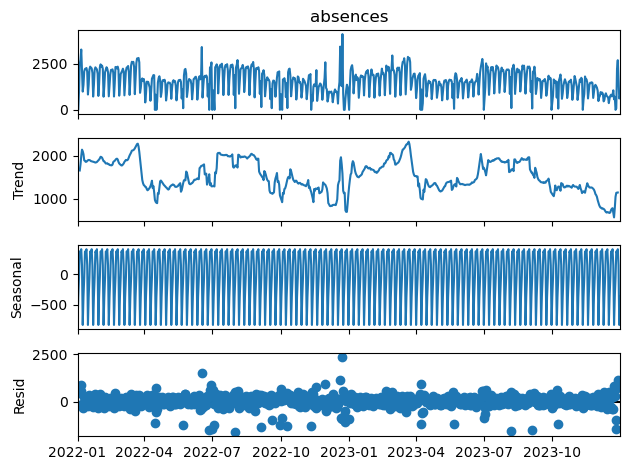

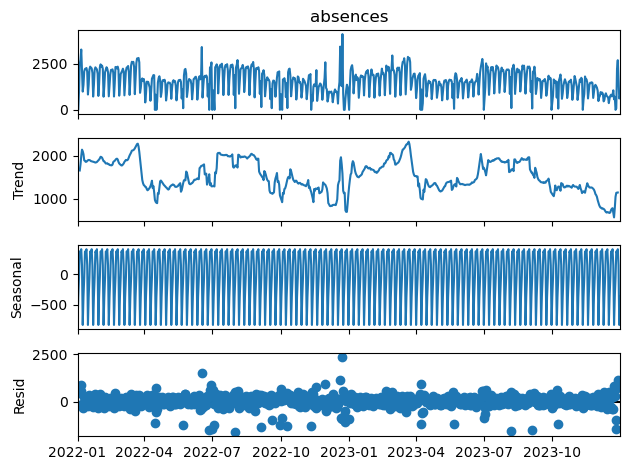

In [15]:
from statsmodels.tsa.seasonal import seasonal_decompose

# Seasonal Decompose
result = seasonal_decompose(df['absences'], model='additive')
result.plot()


In [66]:
# Dropping NaN values that might have been introduced by differencing
#df.dropna(inplace=True)

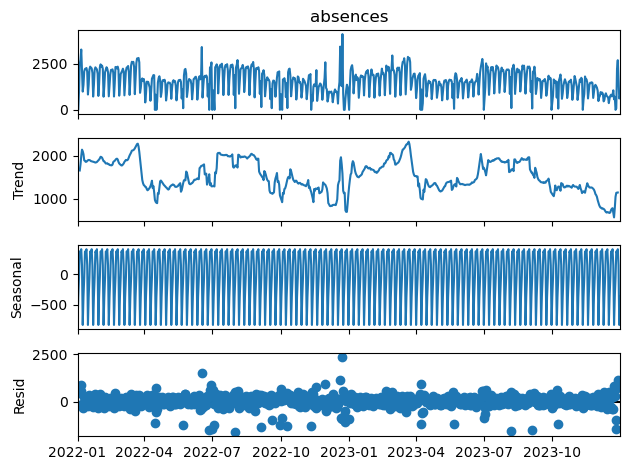

In [16]:
from statsmodels.tsa.seasonal import seasonal_decompose

# Assuming 'Planned Absences' is your target series and it has been cleaned
result = seasonal_decompose(df['absences'], model='additive')

# Plotting the decomposition
decomp_plot = result.plot()

## Sarimax for forecasting Absences

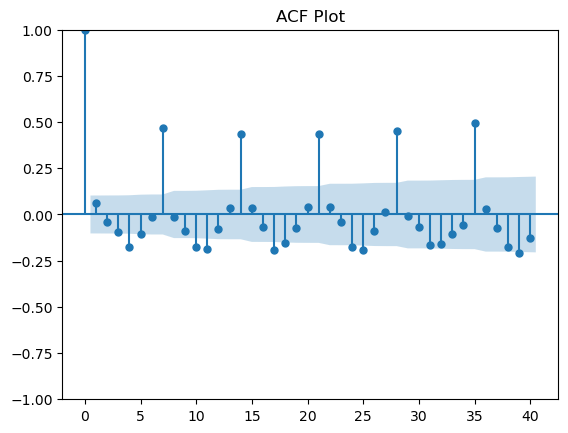

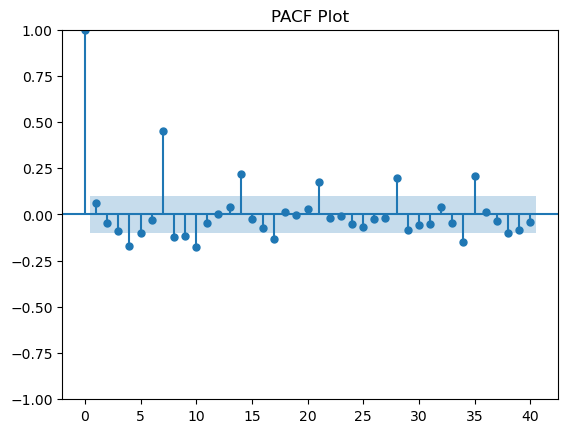

In [17]:
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# Assuming 'Planned_Absences_seasonal_diff' is the differenced series
# Plot ACF
plot_acf(df['absences_seasonal_diff'].dropna(), lags=40)
plt.title('ACF Plot')
plt.show()

# Plot PACF
plot_pacf(df['absences_seasonal_diff'].dropna(), lags=40)
plt.title('PACF Plot')
plt.show()


In [19]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Example parameters (replace these with the ones you've identified)
p, d, q = 1, 1, 1  # Non-seasonal orders
P, D, Q, s = 1, 1, 1, 12  # Seasonal orders (assuming an annual seasonality for monthly data)

# Exogenous variables
exog = df[['Holiday_flag','max_holiday', 'Weather Flag']]

# Fit SARIMAX model
model = SARIMAX(df['absences'], exog=exog, order=(p, d, q), seasonal_order=(P, D, Q, s))
results = model.fit()

# Print the summary of the model
print(results.summary())


C:\Users\mahes\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


                                     SARIMAX Results                                      
Dep. Variable:                           absences   No. Observations:                  730
Model:             SARIMAX(1, 1, 1)x(1, 1, 1, 12)   Log Likelihood               -5599.554
Date:                            Mon, 01 Apr 2024   AIC                          11215.107
Time:                                    11:48:56   BIC                          11251.708
Sample:                                01-01-2022   HQIC                         11229.240
                                     - 12-31-2023                                         
Covariance Type:                              opg                                         
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
Holiday_flag   -13.8031     69.114     -0.200      0.842    -149.265     121.658
max_holiday     86.0523     1

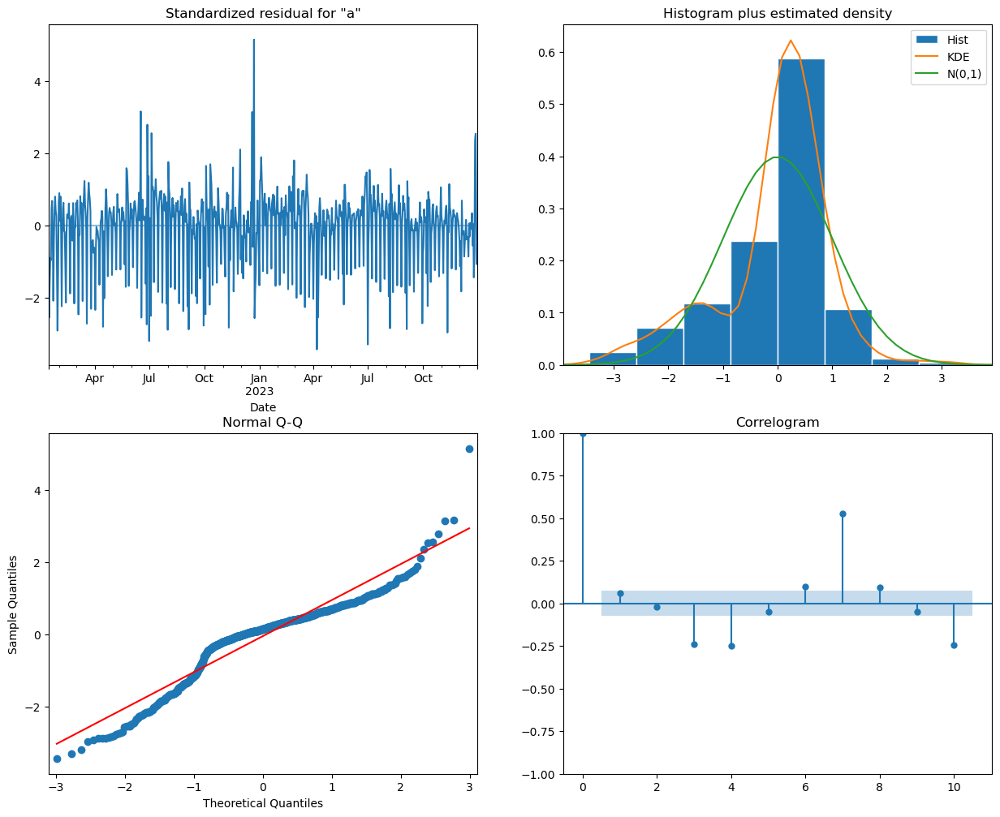

In [20]:
# Plot diagnostic plots
results.plot_diagnostics(figsize=(15, 12))
plt.show()


In [24]:
# Example of forecasting 12 steps ahead with exogenous variables
# Ensure you have future values for your exogenous variables prepared
dfexo = pd.read_excel(r'C:\Users\mahes\Downloads\Capstone_Data.xlsx', sheet_name='Data_forecast')
exog_future = dfexo[['Holiday_flag','max_holiday', 'Weather Flag']]


forecast = results.get_forecast(steps=44, exog=exog_future)
forecast_summary = forecast.summary_frame()
print(forecast_summary)


absences           mean     mean_se  mean_ci_lower  mean_ci_upper
2024-01-01   761.142782  580.453107    -376.524402    1898.809967
2024-01-02  1011.057466  626.540085    -216.938536    2239.053469
2024-01-03   897.166680  637.282813    -351.884682    2146.218042
2024-01-04   878.908656  641.725774    -378.850748    2136.668060
2024-01-05   867.232908  644.629501    -396.217697    2130.683514
2024-01-06   972.156518  647.072872    -296.083006    2240.396043
2024-01-07   919.502202  649.361540    -353.223029    2192.227433
2024-01-08  1056.997068  651.593113    -220.101966    2334.096103
2024-01-09   833.464641  653.800453    -447.960700    2114.889982
2024-01-10   808.950580  655.995028    -476.776049    2094.677209
2024-01-11  1231.962494  658.181238     -58.049027    2521.974015
2024-01-12   918.799192  660.361385    -375.485341    2213.083724
2024-01-13   852.168286  661.227379    -443.813563    2148.150135
2024-01-14   856.824169  662.792397    -442.225057    2155.873396
2024-01-15

In [25]:
dfexo['absences'] = dfexo['Planned Absences'] + dfexo['Unplanned Absences']

# Example: Calculating MAE and RMSE
from sklearn.metrics import mean_absolute_error, mean_squared_error
import numpy as np

true_values = dfexo['absences']  # Your holdout sample or test set
predicted_values = forecast.predicted_mean  # The forecasted values

mae = mean_absolute_error(true_values, predicted_values)
rmse = np.sqrt(mean_squared_error(true_values, predicted_values))

print(f"MAE: {mae}, RMSE: {rmse}")


MAE: 514.2513234988423, RMSE: 678.4262277876688


In [26]:
predicted_values

2024-01-01     761.142782
2024-01-02    1011.057466
2024-01-03     897.166680
2024-01-04     878.908656
2024-01-05     867.232908
2024-01-06     972.156518
2024-01-07     919.502202
2024-01-08    1056.997068
2024-01-09     833.464641
2024-01-10     808.950580
2024-01-11    1231.962494
2024-01-12     918.799192
2024-01-13     852.168286
2024-01-14     856.824169
2024-01-15    1062.068260
2024-01-16     854.621092
2024-01-17    1201.159450
2024-01-18     911.722810
2024-01-19     878.597263
2024-01-20     936.811084
2024-01-21     900.753387
2024-01-22     999.552682
2024-01-23     853.591413
2024-01-24     893.061407
2024-01-25     835.752862
2024-01-26     857.207319
2024-01-27     890.915570
2024-01-28     829.525976
2024-01-29     995.494872
2024-01-30     902.255188
2024-01-31     868.840640
2024-02-01     922.369270
2024-02-02     897.945449
2024-02-03     827.102749
2024-02-04     828.582287
2024-02-05    1040.144173
2024-02-06     824.063455
2024-02-07     845.366716
2024-02-08  

## Sarimax for forecasting Worklolad Sum

In [27]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 730 entries, 2022-01-01 to 2023-12-31
Freq: D
Data columns (total 22 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Workload sum            730 non-null    int64  
 1   Scheduled Hours         730 non-null    float64
 2   Planned Absences        730 non-null    float64
 3   Unplanned Absences      730 non-null    float64
 4   Unpaid Absences         730 non-null    float64
 5   Actual Work Hours       730 non-null    float64
 6   National_Holiday_IND    730 non-null    int64  
 7   Provincial_Holiday_IND  730 non-null    int64  
 8   Impact_Day_FLG          730 non-null    int64  
 9   Day_of_Week             730 non-null    int64  
 10  Week_of_Year            730 non-null    int64  
 11  Day_of_Month            730 non-null    int64  
 12  Month_no                730 non-null    int64  
 13  Year_NO                 730 non-null    int64  
 14  Weather Flag   

In [28]:
# Check for missing values in 'Workload sum'
missing_values = df['Workload sum'].isnull().sum()

print(f"Missing values in 'Workload sum': {missing_values}")


Missing values in 'Workload sum': 0


In [29]:
from statsmodels.tsa.stattools import adfuller

# Perform ADF test on 'Workload sum'
result = adfuller(df['Workload sum'])

print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
for key, value in result[4].items():
    print('Critial Values (%s): %.3f' % (key, value))

# Interpretation
if result[1] > 0.05:
    print("The series is not stationary. Further differencing or transformation is needed.")
else:
    print("The series is stationary. No further differencing is needed.")


ADF Statistic: -3.987448
p-value: 0.001478
Critial Values (1%): -3.440
Critial Values (5%): -2.866
Critial Values (10%): -2.569
The series is stationary. No further differencing is needed.


In [30]:
# First differencing
df['Workload_diff'] = df['Workload sum'].diff()

# Drop any NaN that appeared due to differencing
df.dropna(inplace=True)

# Re-check stationarity with ADF test
result_diff = adfuller(df['Workload_diff'])

print('ADF Statistic: %f' % result_diff[0])
print('p-value: %f' % result_diff[1])
for key, value in result_diff[4].items():
    print('Critial Values (%s): %.3f' % (key, value))

# Interpretation
if result_diff[1] > 0.05:
    print("The differenced series is not stationary. Further differencing might be needed.")
else:
    print("The differenced series is stationary. You can proceed with this transformed series for modeling.")


ADF Statistic: -8.057889
p-value: 0.000000
Critial Values (1%): -3.449
Critial Values (5%): -2.870
Critial Values (10%): -2.571
The differenced series is stationary. You can proceed with this transformed series for modeling.


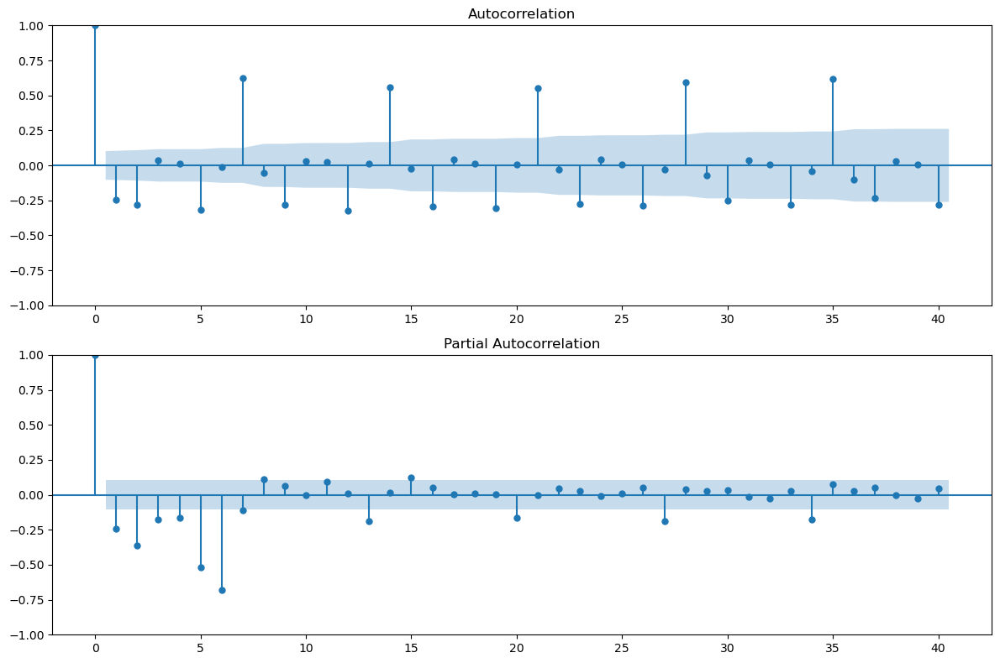

In [31]:
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# Plot ACF and PACF for the differenced stationary series
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 8))

# Plot the ACF
plot_acf(df['Workload_diff'], lags=40, ax=ax1)

# Plot the PACF
plot_pacf(df['Workload_diff'], lags=40, ax=ax2)

plt.tight_layout()
plt.show()


In [32]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Prepare exogenous variables
# Assuming df is your main DataFrame and has a datetime index
exog = df[['National_Holiday_IND', 'Provincial_Holiday_IND', 'Impact_Day_FLG', 'Day_of_Week', 'Week_of_Year', 'Day_of_Month', 'Month_no', 'Year_NO', 'Weather Flag']]

# Convert categorical variables to dummy variables if necessary
# For example, 'Day_of_Week' might need to be converted into dummy variables
exog = pd.get_dummies(exog, columns=['Day_of_Week'], drop_first=True)

# Fit the SARIMAX model with exogenous variables
# Assuming p, d, q, P, D, Q, s values have been identified
model = SARIMAX(df['Workload sum'], exog=exog, order=(p, d, q), seasonal_order=(P, D, Q, s))
results = model.fit()

# Check the summary
print(results.summary())


C:\Users\mahes\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


                                     SARIMAX Results                                      
Dep. Variable:                       Workload sum   No. Observations:                  365
Model:             SARIMAX(1, 1, 1)x(1, 1, 1, 12)   Log Likelihood               -3643.565
Date:                            Mon, 01 Apr 2024   AIC                           7325.131
Time:                                    11:56:32   BIC                           7398.540
Sample:                                01-01-2023   HQIC                          7354.344
                                     - 12-31-2023                                         
Covariance Type:                              opg                                         
                             coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------
National_Holiday_IND   -6.999e+04   2361.719    -29.636      0.000   -7.46e+04   -6.54e+04

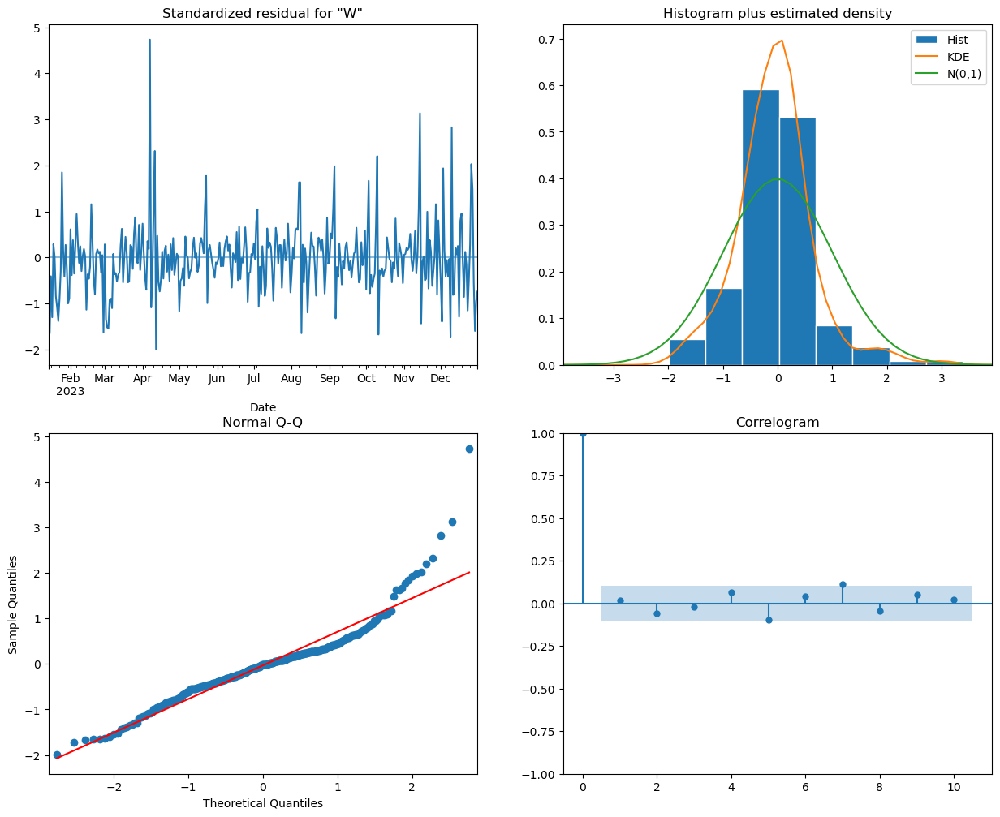

In [33]:
# Diagnostic plots
results.plot_diagnostics(figsize=(15, 12))
plt.show()


In [34]:
# Assuming you have a validation set 'dfexo' and corresponding exogenous variables 'exog_future'
dfexog = pd.read_excel(r'C:\Users\mahes\Downloads\Capstone_Data.xlsx', sheet_name='Data_forecast')
exo_future = dfexog[['National_Holiday_IND', 'Provincial_Holiday_IND', 'Impact_Day_FLG', 'Day_of_Week', 'Week_of_Year', 'Day_of_Month', 'Month_no', 'Year_NO', 'Weather Flag']]
forecast = results.get_forecast(steps=44, exog=exo_future)
predicted_values = forecast.predicted_mean
actual_values = dfexog['Workload sum']

# Calculate performance metrics
from sklearn.metrics import mean_absolute_error, mean_squared_error
mae = mean_absolute_error(actual_values, predicted_values)
rmse = mean_squared_error(actual_values, predicted_values, squared=False)

print(f'MAE: {mae}, RMSE: {rmse}')





ValueError: Provided exogenous values are not of the appropriate shape. Required (44, 14), got (44, 9).

In [37]:
# Apply the same dummy variable encoding to the forecasting set
exo_future = pd.get_dummies(dfexog[['Holiday_flag','max_holiday', 'Day_of_Week', 'Week_of_Year', 'Day_of_Month', 'Month_no', 'Year_NO', 'Weather Flag']], columns=['Day_of_Week'], drop_first=True)

# Add the missing dummy columns with 0s for any categories that are missing
missing_cols = set(exog.columns) - set(exo_future.columns)
for c in missing_cols:
    exo_future[c] = 0

# Ensure the order of the columns matches the training data
exo_future = exo_future[exog.columns]

# Now you can use exo_future for making predictions
forecast = results.get_forecast(steps=44, exog=exo_future)
forecast_summary = forecast.summary_frame()
predicted_values = forecast_summary['mean']


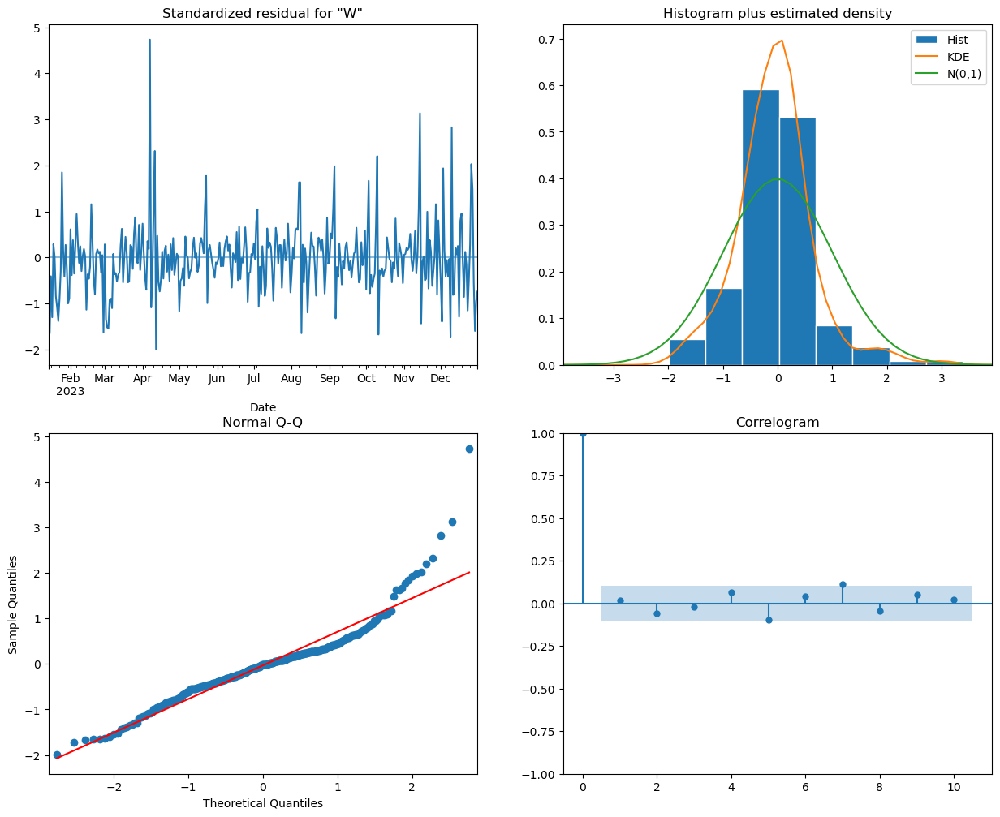

In [38]:
results.plot_diagnostics(figsize=(15, 12))
plt.show()


In [39]:
# Ensure that dfexog has an index that matches the forecast dates and contains the 'Workload sum' column
actual_values = dfexog['Workload sum']

# Now calculate the errors
mae = mean_absolute_error(actual_values, predicted_values)
rmse = mean_squared_error(actual_values, predicted_values, squared=False)  # squared=False to get the RMSE

# Print the performance metrics
print(f'MAE: {mae}')
print(f'RMSE: {rmse}')


MAE: 2462762.5484329504
RMSE: 2462789.7425490366


In [40]:
forecast_summary

Workload sum,mean,mean_se,mean_ci_lower,mean_ci_upper
2024-01-01,-2.401298e+06,9362.780777,-2.419648e+06,-2.382947e+06
2024-01-02,-2.418877e+06,10313.892404,-2.439092e+06,-2.398662e+06
2024-01-03,-2.423917e+06,10775.242866,-2.445036e+06,-2.402798e+06
2024-01-04,-2.432375e+06,11140.691738,-2.454211e+06,-2.410540e+06
2024-01-05,-2.432836e+06,11477.665678,-2.455332e+06,-2.410340e+06
2024-01-06,-2.466458e+06,11801.153917,-2.489588e+06,-2.443328e+06
2024-01-07,-2.463142e+06,12115.090883,-2.486887e+06,-2.439397e+06
2024-01-08,-2.399310e+06,12420.896217,-2.423654e+06,-2.374965e+06
2024-01-09,-2.422152e+06,12719.301459,-2.447081e+06,-2.397222e+06
2024-01-10,-2.428464e+06,13010.853328,-2.453965e+06,-2.402963e+06


In [42]:
forecast

In [15]:
# Convert the 'Date' column to datetime format
df['Date'] = pd.to_datetime(df['Date'])

In [17]:
# Set the 'Date' column as the index of the DataFrame
df.set_index('Date', inplace=True)

In [18]:
# Reindex the DataFrame to fill in any missing dates
# Generate a complete date range for your dataset
start_date = df.index.min()
end_date = df.index.max()
date_range = pd.date_range(start=start_date, end=end_date, freq='D')  # 'D' for daily frequency

# Reindex the DataFrame to this complete date range
df = df.reindex(date_range)

# You can then decide how to handle any newly introduced missing values, if any
df.fillna(method='ffill', inplace=True)  # Example: forward fill

In [19]:
df.head()

,Workload sum,Scheduled Hours,Planned Absences,Unplanned Absences,Unpaid Absences,Actual Work Hours,National_Holiday_IND,Provincial_Holiday_IND,Impact_Day_FLG,Day_of_Week,Week_of_Year,Day_of_Month,Month_no,Year_NO,Weather Flag
2019-01-01,8.0,0.00,0.00,0.00,0.00,0.00,1.0,0.0,0.0,3.0,0.0,1.0,1.0,2019.0,0.0
2019-01-02,40804.0,8885.90,1195.23,647.96,296.59,7042.71,0.0,0.0,0.0,4.0,0.0,2.0,1.0,2019.0,0.0
2019-01-03,42189.0,9656.08,1218.42,562.20,283.91,7875.46,0.0,0.0,0.0,5.0,0.0,3.0,1.0,2019.0,1.0
2019-01-04,44384.0,8795.96,1269.42,578.67,277.13,6947.87,0.0,0.0,0.0,6.0,0.0,4.0,1.0,2019.0,0.0
2019-01-05,11.0,4354.98,575.00,305.32,132.69,3474.66,0.0,0.0,0.0,7.0,0.0,5.0,1.0,2019.0,0.0
